In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/input-store/oil.csv
/kaggle/input/input-store/sample_submission.csv
/kaggle/input/input-store/holidays_events.csv
/kaggle/input/input-store/stores.csv
/kaggle/input/input-store/train.csv
/kaggle/input/input-store/test.csv
/kaggle/input/input-store/transactions.csv
/kaggle/input/sales-forecasting-for-time-series-data/oil.csv
/kaggle/input/sales-forecasting-for-time-series-data/sample_submission.csv
/kaggle/input/sales-forecasting-for-time-series-data/holidays_events.csv
/kaggle/input/sales-forecasting-for-time-series-data/stores.csv
/kaggle/input/sales-forecasting-for-time-series-data/train.csv
/kaggle/input/sales-forecasting-for-time-series-data/test.csv
/kaggle/input/sales-forecasting-for-time-series-data/transactions.csv


## Imports

In [ ]:
# BASE
# ------------------------------------------------------
import numpy as np
import pandas as pd
import os
import gc
import warnings

# PACF - ACF
# ------------------------------------------------------
import statsmodels.api as sm

# DATA VISUALIZATION
# ------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# CONFIGURATIONS
# ------------------------------------------------------
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

## Importing Data

In [ ]:
train = pd.read_csv("/kaggle/input/input-store/train.csv")
test = pd.read_csv("/kaggle/input/input-store/test.csv")
stores = pd.read_csv("/kaggle/input/input-store/stores.csv")
#sub = pd.read_csv("data/sample_submission.csv")
transactions = pd.read_csv("/kaggle/input/input-store/transactions.csv").sort_values(["store_nbr", "date"])

# Datetime
train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)

# Data types
train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00


#  Transactions

**Let's start with the transaction data**

In [ ]:
transactions.head(10)

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520
231,2013-01-07,1,1807
277,2013-01-08,1,1869
323,2013-01-09,1,1910
369,2013-01-10,1,1679
415,2013-01-11,1,1813


In [ ]:
transactions.isnull().sum()

date            0
store_nbr       0
transactions    0
dtype: int64

In [ ]:
temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8175


There is a stable pattern in Transaction. All months are similar except December from 2013 to 2017 by boxplot.

**Observations**
- (Spearman Correlation: 0.8175)
- Store sales had always increased at the end of the year.
- Can increase transaction count by using discounts and promotions.
- Target promotions during low-traffic periods.
- Ensure Stock Availability to prevent loss in sales due to items being out of stock.

<Axes: xlabel='year', ylabel='transactions'>

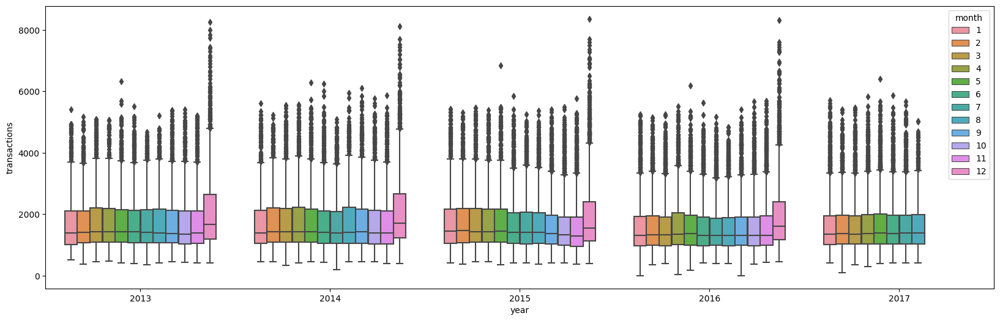

In [ ]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
plt.figure(figsize=(20, 6))
sns.boxplot(data=a, x="year", y="transactions", hue="month")

We can see that transactions increase in spring and decrease after spring.

In [ ]:
a = transactions.set_index("date").resample("M").transactions.mean().reset_index()
a["year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='year',title = "Monthly Average Transactions" )

Total Sales and Transactions are highly correlated.

In [ ]:
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

In [ ]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions")

**Observations:**
- The no. of transactions are the highest on the weekends.
- Sales are mostly constant during the weekdays.
- A small dip during the wednesdays or thurdays.

 ## Oil Price

In [ ]:
# Import
oil = pd.read_csv("/kaggle/input/input-store/oil.csv")
oil["date"] = pd.to_datetime(oil.date)
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )



In [ ]:
oil.to_csv("oil_interpolated.csv",index=False)

Correlation with Daily Oil Prices
sales          -0.30
transactions    0.04
Name: dcoilwtico_interpolated, dtype: float64 



Text(0.5, 1.0, 'Daily Oil Price & Sales')

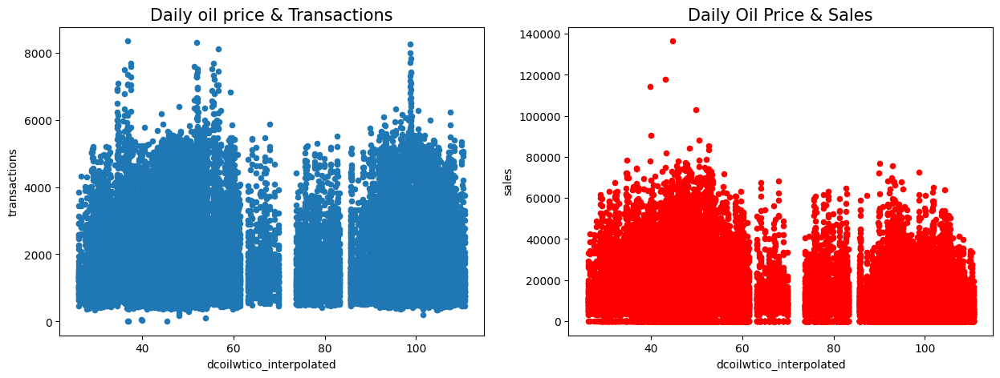

In [ ]:
temp = pd.merge(temp, oil, how = "left")
print("Correlation with Daily Oil Prices")
print(temp.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman").dcoilwtico_interpolated.loc[["sales", "transactions"]], "\n")


fig, axes = plt.subplots(1, 2, figsize = (15,5))
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "transactions", ax=axes[0])
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1], color = "r")
axes[0].set_title('Daily oil price & Transactions', fontsize = 15)
axes[1].set_title('Daily Oil Price & Sales', fontsize = 15)

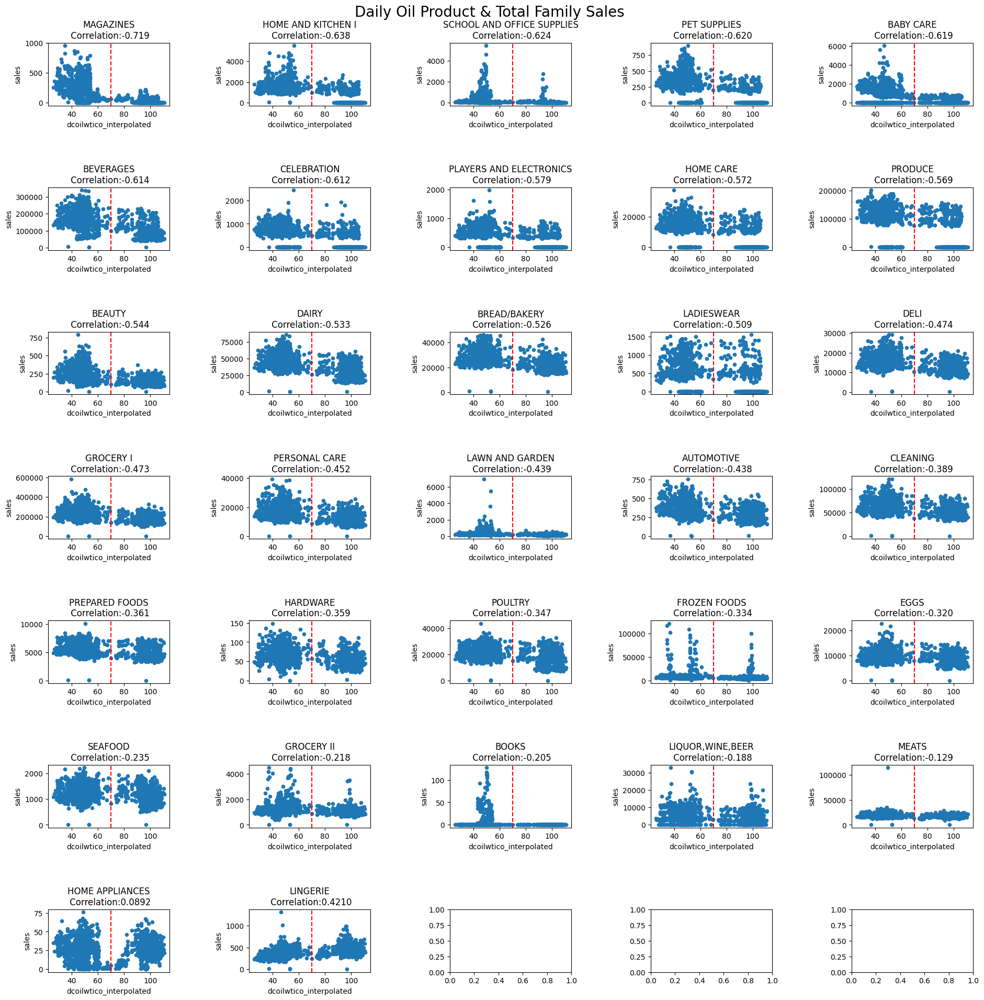

In [ ]:
a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    if i < 6:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[0, i-1])
        axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    if i >= 6 and i<11:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1, i-6])
        axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    if i >= 11 and i<16:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[2, i-11])
        axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    if i >= 16 and i<21:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[3, i-16])
        axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    if i >= 21 and i<26:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[4, i-21])
        axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    if i >= 26 and i < 31:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[5, i-26])
        axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    if i >= 31 :
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[6, i-31])
        axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[6, i-31].axvline(x=70, color='r', linestyle='--')


plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()


## Sales

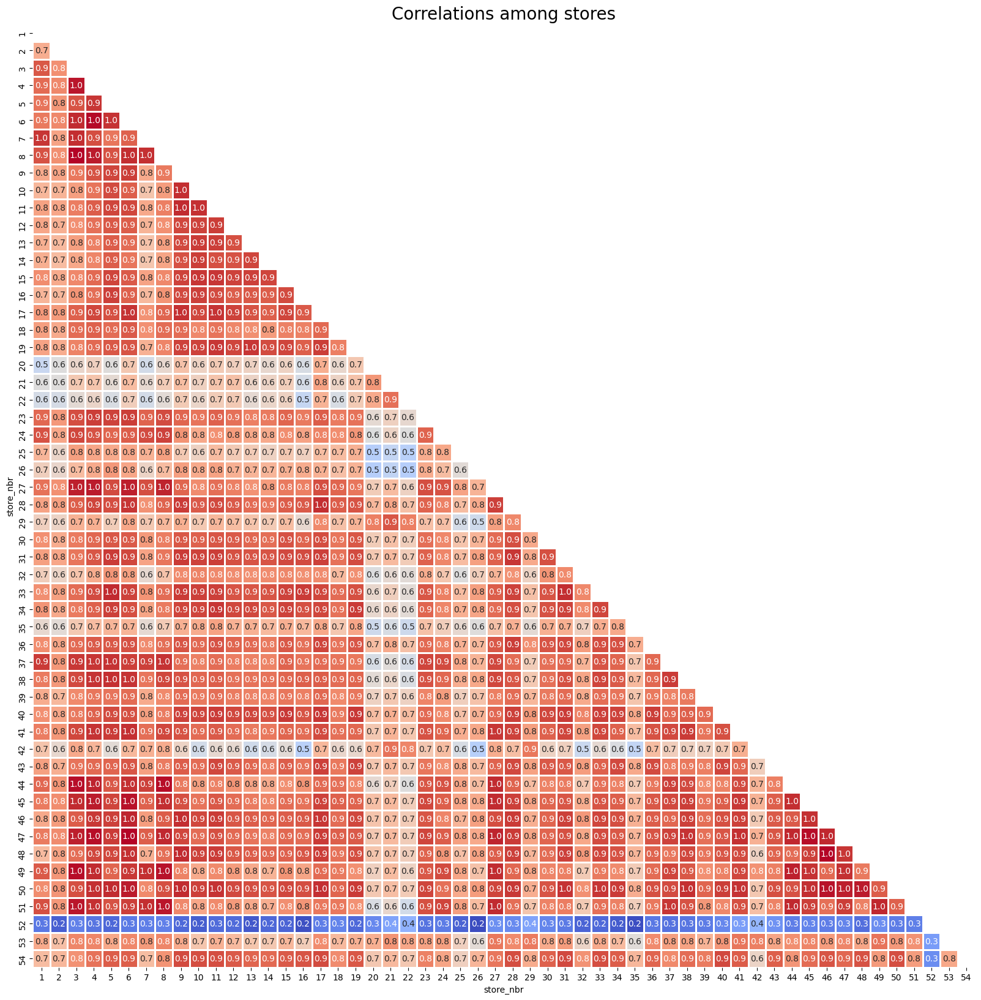

In [ ]:
a = train[["store_nbr", "sales"]]
a["ind"] = 1
a["ind"] = a.groupby("store_nbr").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(a.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores",fontsize = 20)
plt.show()

Most of the stores are similar to each other, when we examine them with correlation matrix. Some stores, such as 20, 21, 22, and 52 may be a little different.


Trying clustering the stores on the basis of sales


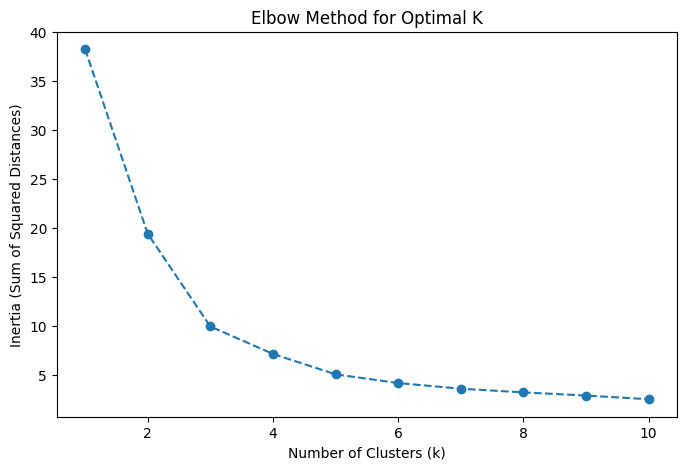

In [ ]:
from sklearn.cluster import KMeans

inertia = []
k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(a)
    inertia.append(kmeans.inertia_)

#Elbow Graph
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, marker="o", linestyle="--")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.title("Elbow Method for Optimal K")
plt.show()

- Three clusters possible as there is an elbow at the number 3.

In [ ]:
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(a)
a["cluster"] = clusters

clusters

array([0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2,
       0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 2, 0], dtype=int32)

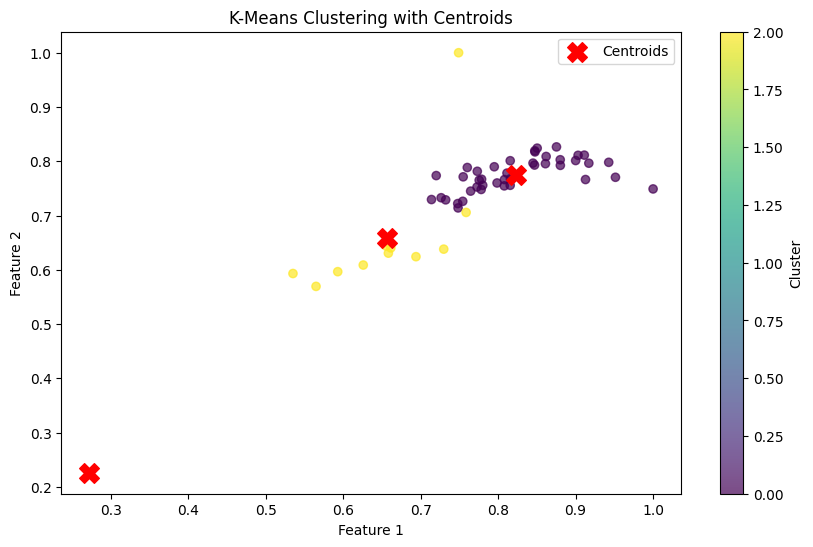

In [ ]:
centroids = kmeans.cluster_centers_

plt.figure(figsize=(10, 6))
scatter = plt.scatter(a.iloc[:, 0], a.iloc[:, 1], c=a["cluster"], cmap="viridis", alpha=0.7)

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], c="red", marker="X", s=200, label="Centroids")

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("K-Means Clustering with Centroids")
plt.legend()
plt.colorbar(scatter, label="Cluster")
plt.show()

In [ ]:
a = train.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores")

Removing the missing data

In [ ]:
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
train.shape

(3000888, 6)


(2780316, 6)

## Zero Forecasting


In [ ]:
c = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
c = c[c.sales == 0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.00
397,13,BABY CARE,0.00
727,23,BABY CARE,0.00
1420,44,BABY CARE,0.00
1453,45,BABY CARE,0.00
1486,46,BABY CARE,0.00
1519,47,BABY CARE,0.00
1552,48,BABY CARE,0.00
1585,49,BABY CARE,0.00
1618,50,BABY CARE,0.00


In [ ]:
print(train.shape)
# Anti Join
outer_join = train.merge(c[c.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
train = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join
gc.collect()
train.shape

(2780316, 6)


(2698648, 6)

In [ ]:
zero_prediction = []
for i in range(0,len(c)):
    zero_prediction.append(
        pd.DataFrame({
            "date":pd.date_range("2017-08-16", "2017-08-31").tolist(),
            "store_nbr":c.store_nbr.iloc[i],
            "family":c.family.iloc[i],
            "sales":0
        })
    )
zero_prediction = pd.concat(zero_prediction)
del c
gc.collect()
zero_prediction

,date,store_nbr,family,sales
0,2017-08-16,1,BABY CARE,0
1,2017-08-17,1,BABY CARE,0
2,2017-08-18,1,BABY CARE,0
3,2017-08-19,1,BABY CARE,0
4,2017-08-20,1,BABY CARE,0
...,...,...,...,...
11,2017-08-27,54,LAWN AND GARDEN,0
12,2017-08-28,54,LAWN AND GARDEN,0
13,2017-08-29,54,LAWN AND GARDEN,0
14,2017-08-30,54,LAWN AND GARDEN,0


Some product families depends on seasonality. So checking for seasonality in the stores and its sales:


In [ ]:
c = train.groupby(["family", "store_nbr"]).tail(60).groupby(["family", "store_nbr"]).sales.sum().reset_index()
c[c.sales == 0]

,family,store_nbr,sales
54,BABY CARE,2,0.00
62,BABY CARE,10,0.00
64,BABY CARE,12,0.00
65,BABY CARE,14,0.00
76,BABY CARE,26,0.00
82,BABY CARE,32,0.00
83,BABY CARE,33,0.00
87,BABY CARE,37,0.00
88,BABY CARE,38,0.00
92,BABY CARE,42,0.00


cannot tell by just 60 days of 0 sales if the passive the sales would be seasonal.

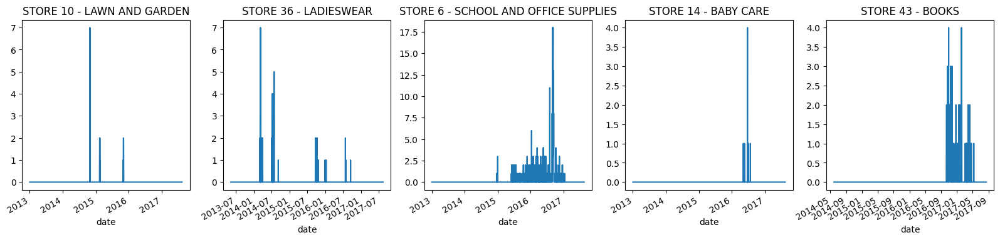

In [ ]:
fig, ax = plt.subplots(1,5, figsize = (20,4))
train[(train.store_nbr == 10) & (train.family == "LAWN AND GARDEN")].set_index("date").sales.plot(ax = ax[0], title = "STORE 10 - LAWN AND GARDEN")
train[(train.store_nbr == 36) & (train.family == "LADIESWEAR")].set_index("date").sales.plot(ax = ax[1], title = "STORE 36 - LADIESWEAR")
train[(train.store_nbr == 6) & (train.family == "SCHOOL AND OFFICE SUPPLIES")].set_index("date").sales.plot(ax = ax[2], title = "STORE 6 - SCHOOL AND OFFICE SUPPLIES")
train[(train.store_nbr == 14) & (train.family == "BABY CARE")].set_index("date").sales.plot(ax = ax[3], title = "STORE 14 - BABY CARE")
train[(train.store_nbr == 53) & (train.family == "BOOKS")].set_index("date").sales.plot(ax = ax[4], title = "STORE 43 - BOOKS")
plt.show()

**Observations**
- Sales are very seasonal for some of the stores

In [ ]:
a = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "family", title = "Daily total sales of the family")

In [ ]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

**Observation:**
- GROCERY I and BEVERAGES are the top selling families.

In [ ]:
d = pd.merge(train, stores)
d["store_nbr"] = d["store_nbr"].astype("int8")
d["year"] = d.date.dt.year
px.line(d.groupby(["city", "year"]).sales.mean().reset_index(), x = "year", y = "sales", color = "city")

In [ ]:
d.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,year
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,2013
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,2013
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,2013
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,2013
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,Quito,Pichincha,D,13,2013


In [ ]:
d

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,year
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,2013
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,2013
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,2013
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,2013
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,Quito,Pichincha,D,13,2013
...,...,...,...,...,...,...,...,...,...,...,...
2698643,2993627,2017-08-11,54,SEAFOOD,0.00,0.00,El Carmen,Manabi,C,3,2017
2698644,2995409,2017-08-12,54,SEAFOOD,1.00,1.00,El Carmen,Manabi,C,3,2017
2698645,2997191,2017-08-13,54,SEAFOOD,2.00,0.00,El Carmen,Manabi,C,3,2017
2698646,2998973,2017-08-14,54,SEAFOOD,0.00,0.00,El Carmen,Manabi,C,3,2017


## Holidays and Events

In [ ]:
holidays = pd.read_csv("/kaggle/input/input-store/holidays_events.csv")
holidays["date"] = pd.to_datetime(holidays.date)


# Transferred Holidays
tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]

holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
# holidays = holidays.append(tr).reset_index(drop = True)
holidays = pd.concat([holidays, tr], ignore_index=True)

# Additional Holidays
holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

# Bridge Holidays
holidays["description"] = holidays["description"].str.replace("Puente ", "")
holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])


# Work Day Holidays, that is meant to payback the Bridge.
work_day = holidays[holidays.type == "Work Day"]
holidays = holidays[holidays.type != "Work Day"]


# Split

# Events are national
events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()



# d = pd.merge(train.append(test), stores)
d = pd.merge(pd.concat([train, test], ignore_index=True), stores)
d["store_nbr"] = d["store_nbr"].astype("int8")


# National Holidays & Events
#d = pd.merge(d, events, how = "left")
d = pd.merge(d, national, how = "left")
# Regional
d = pd.merge(d, regional, how = "left", on = ["date", "state"])
# Local
d = pd.merge(d, local, how = "left", on = ["date", "city"])

# Work Day: It will be removed when real work day colum created
d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")

# EVENTS
events["events"] =np.where(events.events.str.contains("futbol"), "Futbol", events.events)

def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
    # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    df.columns = df.columns.str.replace(" ", "_")
    return df, df.columns.tolist()

events, events_cat = one_hot_encoder(events, nan_as_category=False)
events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
events = events.drop(239)

d = pd.merge(d, events, how = "left")
d[events_cat] = d[events_cat].fillna(0)

# New features
d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

#
d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)

he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
d[he_cols] = d[he_cols].astype("int8")

d[["family", "city", "state", "type"]] = d[["family", "city", "state", "type"]].astype("category")

del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
gc.collect()

d.head(10)
# d.to_csv("merged.csv",index=False)

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,IsWorkDay,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,events_Terremoto_Manabi1,events_Terremoto_Manabi10,events_Terremoto_Manabi11,events_Terremoto_Manabi12,events_Terremoto_Manabi13,events_Terremoto_Manabi14,events_Terremoto_Manabi15,events_Terremoto_Manabi16,events_Terremoto_Manabi17,events_Terremoto_Manabi18,events_Terremoto_Manabi19,events_Terremoto_Manabi2,events_Terremoto_Manabi20,events_Terremoto_Manabi21,events_Terremoto_Manabi22,events_Terremoto_Manabi23,events_Terremoto_Manabi24,events_Terremoto_Manabi25,events_Terremoto_Manabi26,events_Terremoto_Manabi27,events_Terremoto_Manabi28,events_Terremoto_Manabi29,events_Terremoto_Manabi3,events_Terremoto_Manabi30,events_Terremoto_Manabi4,events_Terremoto_Manabi5,events_Terremoto_Manabi6,events_Terremoto_Manabi7,events_Terremoto_Manabi8,events_Terremoto_Manabi9,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre1,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Navidad1,holiday_national_Navidad2,holiday_national_Navidad3,holiday_national_Navidad4,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Primer_dia_del_ano1,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Guayaquil1,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Quito1,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,Quito,Pichincha,D,13,Work Day,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,8910,2013-01-06,1,AUTOMOTIVE,2.00,0.00,Quito

Applying an AB test to Events and Holidays features.

In [ ]:
def AB_Test(dataframe, group, target):

    # Packages
    from scipy.stats import shapiro
    import scipy.stats as stats

    # Split A/B
    groupA = dataframe[dataframe[group] == 1][target]
    groupB = dataframe[dataframe[group] == 0][target]

    # Assumption: Normality
    ntA = shapiro(groupA)[1] < 0.05
    ntB = shapiro(groupB)[1] < 0.05
    # H0: Distribution is Normal! - False
    # H1: Distribution is not Normal! - True

    if (ntA == False) & (ntB == False): # "H0: Normal Distribution"
        # Parametric Test
        # Assumption: Homogeneity of variances
        leveneTest = stats.levene(groupA, groupB)[1] < 0.05
        # H0: Homogeneity: False
        # H1: Heterogeneous: True

        if leveneTest == False:
            # Homogeneity
            ttest = stats.ttest_ind(groupA, groupB, equal_var=True)[1]
            # H0: M1 == M2 - False
            # H1: M1 != M2 - True
        else:
            # Heterogeneous
            ttest = stats.ttest_ind(groupA, groupB, equal_var=False)[1]
            # H0: M1 == M2 - False
            # H1: M1 != M2 - True
    else:
        # Non-Parametric Test
        ttest = stats.mannwhitneyu(groupA, groupB)[1]
        # H0: M1 == M2 - False
        # H1: M1 != M2 - True

    # Result
    temp = pd.DataFrame({
        "AB Hypothesis":[ttest < 0.05],
        "p-value":[ttest]
    })
    temp["Test Type"] = np.where((ntA == False) & (ntB == False), "Parametric", "Non-Parametric")
    temp["AB Hypothesis"] = np.where(temp["AB Hypothesis"] == False, "Fail to Reject H0", "Reject H0")
    temp["Comment"] = np.where(temp["AB Hypothesis"] == "Fail to Reject H0", "A/B groups are similar!", "A/B groups are not similar!")
    temp["Feature"] = group
    temp["GroupA_mean"] = groupA.mean()
    temp["GroupB_mean"] = groupB.mean()
    temp["GroupA_median"] = groupA.median()
    temp["GroupB_median"] = groupB.median()

    # Columns
    if (ntA == False) & (ntB == False):
        temp["Homogeneity"] = np.where(leveneTest == False, "Yes", "No")
        temp = temp[["Feature","Test Type", "Homogeneity","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    else:
        temp = temp[["Feature","Test Type","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]

    # Print Hypothesis
    # print("# A/B Testing Hypothesis")
    # print("H0: A == B")
    # print("H1: A != B", "\n")

    return temp

# Apply A/B Testing
he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
ab = []
for i in he_cols:
    ab.append(AB_Test(dataframe=d[d.sales.notnull()], group = i, target = "sales"))
ab = pd.concat(ab)
ab

,Feature,Test Type,AB Hypothesis,p-value,Comment,GroupA_mean,GroupB_mean,GroupA_median,GroupB_median
0,events_Black_Friday,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,393.70,397.94,26.58,19.00
0,events_Cyber_Monday,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,472.65,397.80,24.00,19.00
0,events_Dia_de_la_Madre,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,386.35,397.97,17.00,19.00
0,events_Futbol,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,360.30,398.24,13.00,19.00
0,events_Terremoto_Manabi,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,507.73,397.87,38.00,19.00
...,...,...,...,...,...,...,...,...,...
0,holiday_local_Independencia_de_Latacunga,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,178.59,397.95,11.00,19.00
0,national_independence,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,457.03,397.29,23.00,19.00
0,local_cantonizacio,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,397.56,501.64,19.00,26.00
0,local_fundacion,Non-Parametric,Reject H0,0.00,A/B groups are not similar!,398.04,250.79,19.00,14.00


In [ ]:
d.groupby(["family","events_Futbol"]).sales.mean()[:60]

family                   events_Futbol
AUTOMOTIVE               0                  6.59
                         1                  6.20
BABY CARE                0                  0.15
                         1                  0.09
BEAUTY                   0                  4.02
                         1                  2.89
BEVERAGES                0               2578.50
                         1               2243.45
BOOKS                    0                  0.15
                         1                  0.00
BREAD/BAKERY             0                500.50
                         1                451.53
CELEBRATION              0                  9.06
                         1                  6.43
CLEANING                 0               1158.18
                         1               1102.08
DAIRY                    0                765.51
                         1                759.26
DELI                     0                286.38
                         1    

## Time Related Features

In [ ]:
def create_date_features(df):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = ((df.date.dt.day - 1) // 7 + 1).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")

    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12, 1, 2]), 0, 1)
    df["season"] = np.where(df.month.isin([6, 7, 8]), 2, df["season"])
    df["season"] = np.where(df.month.isin([9, 10, 11]), 3, df["season"])
    df["season"] = df["season"].astype("int8")

    return df

d = create_date_features(d)


# Workday column
d["workday"] = np.where((d.holiday_national_binary == 1) | (d.holiday_local_binary==1) | (d.holiday_regional_binary==1) | (d['day_of_week'].isin([6,7])), 0, 1)
d["workday"] = pd.Series(np.where(d.IsWorkDay.notnull(), 1, d["workday"])).astype("int8")
d.drop("IsWorkDay", axis = 1, inplace = True)

# Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month.
# Supermarket sales could be affected by this.
d["wageday"] = pd.Series(np.where((d['is_month_end'] == 1) | (d["day_of_month"] == 15), 1, 0)).astype("int8")

d.head(15)
d.to_csv("date_time_adjusted_merged.csv",index=False)

In [ ]:
d.head(15)

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,events_Terremoto_Manabi1,events_Terremoto_Manabi10,events_Terremoto_Manabi11,events_Terremoto_Manabi12,events_Terremoto_Manabi13,events_Terremoto_Manabi14,events_Terremoto_Manabi15,events_Terremoto_Manabi16,events_Terremoto_Manabi17,events_Terremoto_Manabi18,events_Terremoto_Manabi19,events_Terremoto_Manabi2,events_Terremoto_Manabi20,events_Terremoto_Manabi21,events_Terremoto_Manabi22,events_Terremoto_Manabi23,events_Terremoto_Manabi24,events_Terremoto_Manabi25,events_Terremoto_Manabi26,events_Terremoto_Manabi27,events_Terremoto_Manabi28,events_Terremoto_Manabi29,events_Terremoto_Manabi3,events_Terremoto_Manabi30,events_Terremoto_Manabi4,events_Terremoto_Manabi5,events_Terremoto_Manabi6,events_Terremoto_Manabi7,events_Terremoto_Manabi8,events_Terremoto_Manabi9,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre1,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Navidad1,holiday_national_Navidad2,holiday_national_Navidad3,holiday_national_Navidad4,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Primer_dia_del_ano1,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Guayaquil1,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Quito1,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,3,2013,0,1,0,0,0,0,0,0,0,1,0
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,4,2013,0,1,0,0,0,0,0,0,0,1,0
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,1,5,2013,1,1,

Checking whether Earthquakes affect the store sales or not.


In [ ]:
d[(d.month.isin([4,5]))].groupby(["year"]).sales.mean()

year
2013   249.38
2014   285.53
2015   334.68
2016   489.90
2017   503.50
Name: sales, dtype: float32

Mean of the sales for the year 2013-2017 for the months of 4 and 5 calculated.

#### March

In [ ]:
pd.pivot_table(d[(d.month.isin([3]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.35,0.00,2.74,1277.85,0.00,416.57,0.00,1055.67,429.53,229.49,157.80,95.06,3281.80,20.69,1.11,0.00,0.00,0.80,0.00,0.00,3.31,9.33,74.50,0.00,368.54,223.88,0.00,0.00,223.56,106.08,2.83,0.00,28.10
2014,6.94,0.06,3.55,3040.63,0.00,446.92,14.74,1215.01,815.26,261.29,189.67,138.42,3807.03,21.25,1.50,23.82,12.52,0.71,297.74,16.65,5.63,8.49,95.85,1.34,382.59,265.75,5.50,11.02,449.17,112.42,2300.86,1.53,27.45
2015,7.55,0.00,2.78,1515.37,0.00,547.43,0.00,1219.26,806.57,329.61,209.24,129.68,4016.91,23.82,1.13,24.85,18.66,0.85,0.00,0.00,5.35,6.52,91.09,0.00,356.97,316.62,0.00,0.00,420.88,104.59,4.51,0.00,28.61
2016,7.34,0.34,4.34,3023.50,0.00,501.95,14.23,1077.72,859.32,277.81,177.58,131.25,4088.61,19.78,1.32,26.11,25.67,0.31,267.45,13.88,5.35,4.92,89.79,6.07,330.77,296.47,5.89,8.72,374.97,109.86,2304.82,1.96,23.89
2017,7.79,0.34,4.29,3733.14,0.59,584.24,14.21,1220.11,991.14,326.49,199.83,130.17,4800.77,22.14,1.45,29.23,29.95,0.71,319.10,14.74,15.97,6.88,89.70,6.28,374.28,331.43,8.79,11.39,395.35,114.03,2442.19,5.02,25.54


#### April - May

In [ ]:
pd.pivot_table(d[(d.month.isin([4,5]))], index="year", columns="family", values="sales", aggfunc="mean")


family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.84,0.00,2.61,1260.96,0.00,418.76,0.00,1027.76,408.36,234.52,154.75,104.79,3308.63,21.95,1.01,0.00,0.00,0.75,0.00,0.00,3.23,9.39,71.10,0.00,377.75,224.65,0.00,0.00,221.59,96.68,5.35,0.00,25.37
2014,5.75,0.00,2.61,1461.64,0.00,416.34,0.00,1028.08,766.63,253.55,184.63,121.35,3614.11,21.44,1.02,0.00,0.00,0.56,0.00,0.00,4.98,8.94,85.83,0.00,361.61,266.44,0.00,0.00,405.27,103.47,5.66,0.00,23.63
2015,6.02,0.00,2.96,1915.16,0.00,551.60,0.00,1227.91,811.31,329.80,198.89,139.64,3989.90,26.46,1.06,26.11,20.73,0.65,127.72,0.00,5.47,8.20,95.21,1.69,365.24,314.39,0.06,0.00,415.49,102.44,5.68,0.00,27.05
2016,7.26,0.32,4.87,3369.27,0.00,551.90,14.25,1218.35,911.86,299.28,186.11,135.95,4898.71,22.04,1.36,27.10,28.28,0.45,315.92,14.96,5.47,6.24,82.89,6.77,363.50,363.47,6.84,10.67,399.37,108.67,2305.70,5.99,24.55
2017,7.63,0.23,5.30,3592.94,0.26,557.84,13.72,1308.01,970.85,323.21,202.54,138.61,4841.85,26.12,1.55,30.31,31.31,0.71,304.85,15.40,19.17,7.83,90.16,6.87,362.41,326.00,9.07,12.22,385.39,96.31,2404.91,11.71,23.17


#### June

In [ ]:
pd.pivot_table(d[(d.month.isin([6]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.89,0.00,2.72,1297.24,0.00,431.05,0.00,1052.44,419.08,238.23,156.45,120.79,3489.13,21.83,0.95,0.00,0.00,0.71,0.00,0.00,3.43,8.85,75.67,0.00,389.95,216.12,0.00,0.00,232.16,100.72,6.12,0.00,20.99
2014,5.72,0.00,2.46,1458.94,0.00,450.82,0.00,1029.45,757.82,260.01,182.69,122.18,3655.15,22.99,1.03,0.00,0.00,0.41,0.00,0.00,4.35,8.60,94.37,0.00,383.37,270.10,0.00,0.00,409.03,101.04,5.75,0.00,23.97
2015,6.52,0.18,3.79,3178.15,0.00,549.95,14.74,1177.30,829.06,328.15,196.27,139.39,3903.51,25.12,1.30,26.92,31.28,0.12,288.21,16.89,5.27,7.83,101.28,1.53,376.68,297.36,5.87,8.72,411.02,108.23,2346.14,1.33,25.85
2016,6.25,0.35,4.55,2806.97,0.00,550.81,13.96,1108.43,863.92,280.66,182.98,129.32,4170.43,21.84,1.08,28.62,25.08,0.29,260.83,14.07,5.66,4.43,85.12,5.67,350.66,292.74,5.95,8.50,373.23,104.96,2239.03,1.55,23.18
2017,7.38,0.23,5.43,3580.13,0.08,555.64,13.80,1228.70,932.53,317.70,202.11,137.49,4702.43,29.26,1.40,33.93,30.85,0.64,286.55,14.65,17.85,6.78,95.40,6.19,388.38,319.44,9.22,11.34,406.58,90.90,2403.45,1.58,19.36


In [ ]:
d.shape

(2728952, 114)

In [ ]:
d = d.drop(columns=['dcoilwtico', 'dcoilwtico_interpolated'], errors='ignore')

oil_interpolated = pd.read_csv("/kaggle/working/oil_interpolated.csv")
oil_interpolated['date'] = pd.to_datetime(oil_interpolated['date'])
d = pd.merge(d, oil_interpolated, how = "left", on = "date")
d.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,events_Terremoto_Manabi1,events_Terremoto_Manabi10,events_Terremoto_Manabi11,events_Terremoto_Manabi12,events_Terremoto_Manabi13,events_Terremoto_Manabi14,events_Terremoto_Manabi15,events_Terremoto_Manabi16,events_Terremoto_Manabi17,events_Terremoto_Manabi18,events_Terremoto_Manabi19,events_Terremoto_Manabi2,events_Terremoto_Manabi20,events_Terremoto_Manabi21,events_Terremoto_Manabi22,events_Terremoto_Manabi23,events_Terremoto_Manabi24,events_Terremoto_Manabi25,events_Terremoto_Manabi26,events_Terremoto_Manabi27,events_Terremoto_Manabi28,events_Terremoto_Manabi29,events_Terremoto_Manabi3,events_Terremoto_Manabi30,events_Terremoto_Manabi4,events_Terremoto_Manabi5,events_Terremoto_Manabi6,events_Terremoto_Manabi7,events_Terremoto_Manabi8,events_Terremoto_Manabi9,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre1,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Navidad1,holiday_national_Navidad2,holiday_national_Navidad3,holiday_national_Navidad4,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Primer_dia_del_ano1,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Guayaquil1,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Quito1,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday,dcoilwtico,dcoilwtico_interpolated
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0,NaN,NaN
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,3,2013,0,1,0,0,0,0,0,0,0,1,0,93.14,93.14
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,4,2013,0,1,0,0,0,0,0,0,0,1,0,92.97,92.97
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

pca_cols = [
    'events_Black_Friday', 'events_Cyber_Monday', 'events_Dia_de_la_Madre', 'events_Futbol',
    'events_Terremoto_Manabi', 'events_Terremoto_Manabi1', 'events_Terremoto_Manabi10',
    'events_Terremoto_Manabi11', 'events_Terremoto_Manabi12', 'events_Terremoto_Manabi13',
    'events_Terremoto_Manabi14', 'events_Terremoto_Manabi15', 'events_Terremoto_Manabi16',
    'events_Terremoto_Manabi17', 'events_Terremoto_Manabi18', 'events_Terremoto_Manabi19',
    'events_Terremoto_Manabi2', 'events_Terremoto_Manabi20', 'events_Terremoto_Manabi21',
    'events_Terremoto_Manabi22', 'events_Terremoto_Manabi23', 'events_Terremoto_Manabi24',
    'events_Terremoto_Manabi25', 'events_Terremoto_Manabi26', 'events_Terremoto_Manabi27',
    'events_Terremoto_Manabi28', 'events_Terremoto_Manabi29', 'events_Terremoto_Manabi3',
    'events_Terremoto_Manabi30', 'events_Terremoto_Manabi4', 'events_Terremoto_Manabi5',
    'events_Terremoto_Manabi6', 'events_Terremoto_Manabi7', 'events_Terremoto_Manabi8',
    'events_Terremoto_Manabi9', 'holiday_national_binary', 'holiday_local_binary',
    'holiday_regional_binary', 'national_independence', 'local_cantonizacio', 'local_fundacion',
    'local_independencia', 'holiday_national_Batalla_de_Pichincha', 'holiday_national_Carnaval',
    'holiday_national_Dia_de_Difuntos', 'holiday_national_Dia_de_la_Madre1',
    'holiday_national_Dia_del_Trabajo', 'holiday_national_Independencia_de_Cuenca',
    'holiday_national_Independencia_de_Guayaquil', 'holiday_national_Navidad',
    'holiday_national_Navidad1', 'holiday_national_Navidad2', 'holiday_national_Navidad3',
    'holiday_national_Navidad4', 'holiday_national_Primer_Grito_de_Independencia',
    'holiday_national_Primer_dia_del_ano', 'holiday_national_Primer_dia_del_ano1',
    'holiday_national_Viernes_Santo', 'holiday_regional_Provincializacion_Santa_Elena',
    'holiday_regional_Provincializacion_de_Cotopaxi', 'holiday_regional_Provincializacion_de_Imbabura',
    'holiday_regional_Provincializacion_de_Santo_Domingo', 'holiday_local_Cantonizacion_de_Cayambe',
    'holiday_local_Cantonizacion_de_El_Carmen', 'holiday_local_Cantonizacion_de_Guaranda',
    'holiday_local_Cantonizacion_de_Latacunga', 'holiday_local_Cantonizacion_de_Libertad',
    'holiday_local_Cantonizacion_de_Quevedo', 'holiday_local_Cantonizacion_de_Riobamba',
    'holiday_local_Cantonizacion_de_Salinas', 'holiday_local_Cantonizacion_del_Puyo',
    'holiday_local_Fundacion_de_Ambato', 'holiday_local_Fundacion_de_Cuenca',
    'holiday_local_Fundacion_de_Esmeraldas', 'holiday_local_Fundacion_de_Guayaquil',
    'holiday_local_Fundacion_de_Guayaquil1', 'holiday_local_Fundacion_de_Ibarra',
    'holiday_local_Fundacion_de_Loja', 'holiday_local_Fundacion_de_Machala',
    'holiday_local_Fundacion_de_Manta', 'holiday_local_Fundacion_de_Quito',
    'holiday_local_Fundacion_de_Quito1', 'holiday_local_Fundacion_de_Riobamba',
    'holiday_local_Fundacion_de_Santo_Domingo', 'holiday_local_Independencia_de_Ambato',
    'holiday_local_Independencia_de_Guaranda', 'holiday_local_Independencia_de_Latacunga',
]

scaler = StandardScaler()
pca_scaled = scaler.fit_transform(d[pca_cols])

pca = PCA(n_components=5) # 5 PCA columns
pca_result = pca.fit_transform(pca_scaled)


df_reducedd = d.drop(columns=pca_cols).copy() # drop
df_reducedd["PCA_1"] = pca_result[:, 0]
df_reducedd["PCA_2"] = pca_result[:, 1]
df_reducedd["PCA_3"] = pca_result[:, 2]
df_reducedd["PCA_4"] = pca_result[:, 3]
df_reducedd["PCA_5"] = pca_result[:, 4]

print("Explained variance ratio:", pca.explained_variance_ratio_)

df_reducedd

Explained variance ratio: [0.04593413 0.02822844 0.02298296 0.02205756 0.01870145]


,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,month,day_of_month,day_of_year,week_of_month,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday,dcoilwtico,dcoilwtico_interpolated,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0,NaN,NaN,-0.24,3.90,-0.02,0.03,3.56
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,1,2,2,1,3,2013,0,1,0,0,0,0,0,0,0,1,0,93.14,93.14,-0.12,-0.29,-0.03,-0.00,-0.10
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,1,3,3,1,4,2013,0,1,0,0,0,0,0,0,0,1,0,92.97,92.97,-0.12,-0.29,-0.03,-0.00,-0.10
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,1,4,4,1,5,2013,1,1,0,0,0,0,0,0,0,1,0,93.12,93.12,-0.12,-0.29,-0.03,-0.00,-0.10
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,Quito,Pichincha,D,13,1,5,5,1,6,2013,1,1,0,0,0,0,0,0,0,1,0,NaN,93.15,-0.12,-0.29,-0.03,-0.00,-0.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2728947,3029395,2017-08-31,9,POULTRY,NaN,1.00,Quito,Pichincha,B,6,8,31,243,5,4,2017,0,3,0,1,0,0,0,0,2,1,1,47.26,47.26,-0.12,-0.29,-0.03,-0.00,-0.10
2728948,3029396,2017-08-31,9,PREPARED FOODS,NaN,0.00,Quito,Pichincha,B,6,8,31,243,5,4,2017,0,3,0,1,0,0,0,0,2,1,1,47.26,47.26,-0.12,-0.29,-0.03,-0.00,-0.10
2728949,3029397,2017-08-31,9,PRODUCE,NaN,1.00,Quito,Pichincha,B,6,8,31,243,5,4,2017,0,3,0,1,0,0,0,0,2,1,1,47.26,47.26,-0.12,-0.29,-0.03,-0.00,-0.10
2728950,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,NaN,9.00,Quito,Pichincha,B,6,8,31,243,5,4,2017,0,3,0,1,0,0,0,0,2,1,1,47.26,47.26,-0.12,-0.29,-0.03,-0.00,-0.10


In [ ]:
df_reducedd = df_reducedd[df_reducedd['date'] < '2017-12-01']

In [ ]:
df_reducedd.columns
df = df_reducedd.copy()

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in ["family", "city", "state", "type"]:
    df[col] = le.fit_transform(df[col])


train = df[df['date'] < '2017-01-01']
val = df[(df['date'] >= '2017-01-01') & (df['date'] <= '2017-08-15')]
test = df[df['date'] > '2017-08-15']


X_train, y_train = train.drop(columns=['id', 'date', 'sales']), train['sales']
X_val, y_val = val.drop(columns=['id', 'date', 'sales']), val['sales']
X_test = test.drop(columns=['id', 'date', 'sales'])
print(y_train.isna().sum(),y_val.isna().sum())

model = xgb.XGBRegressor(
    objective="reg:squarederror",
    eval_metric="rmse",
    learning_rate=0.05,
    max_depth=6,
    reg_lambda=1,
    alpha=0.1,
    colsample_bytree=0.8,
    subsample=0.8,
    n_estimators=500
)

model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=50, verbose=True)

y_pred = model.predict(X_val)
rmse = mean_squared_error(y_val, y_pred, squared=False)
print(f"Validation RMSE: {rmse}")

test_preds = model.predict(X_test)

test["sales_pred"] = test_preds
xgboost_predictions = test[["id", "sales_pred"]].rename({"sales_pred":"sales"}, axis = 1)
xgboost_predictions.to_csv("xgboost_predictions.csv", index=False)

0 0
[0]	validation_0-rmse:1336.46090
[1]	validation_0-rmse:1291.28133
[2]	validation_0-rmse:1249.92699
[3]	validation_0-rmse:1210.97627
[4]	validation_0-rmse:1175.60950
[5]	validation_0-rmse:1140.80974
[6]	validation_0-rmse:1108.44936
[7]	validation_0-rmse:1078.02009
[8]	validation_0-rmse:1051.54639
[9]	validation_0-rmse:1023.94475
[10]	validation_0-rmse:1004.02903
[11]	validation_0-rmse:979.52339
[12]	validation_0-rmse:956.73357
[13]	validation_0-rmse:934.77648
[14]	validation_0-rmse:913.76417
[15]	validation_0-rmse:895.80266
[16]	validation_0-rmse:880.95667
[17]	validation_0-rmse:864.10219
[18]	validation_0-rmse:851.22893
[19]	validation_0-rmse:839.85259
[20]	validation_0-rmse:824.03316
[21]	validation_0-rmse:806.81181
[22]	validation_0-rmse:791.02659
[23]	validation_0-rmse:776.42278
[24]	validation_0-rmse:766.17645
[25]	validation_0-rmse:754.20720
[26]	validation_0-rmse:741.13601
[27]	validation_0-rmse:729.95843
[28]	validation_0-rmse:728.56100
[29]	validation_0-rmse:716.81764
[30]	

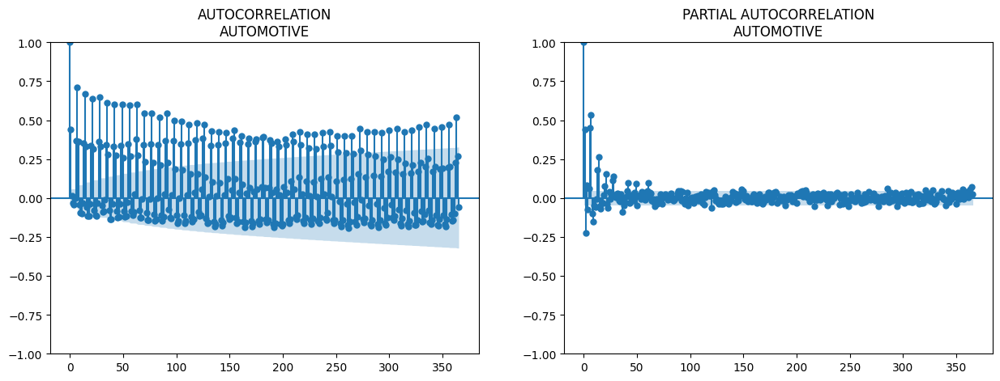

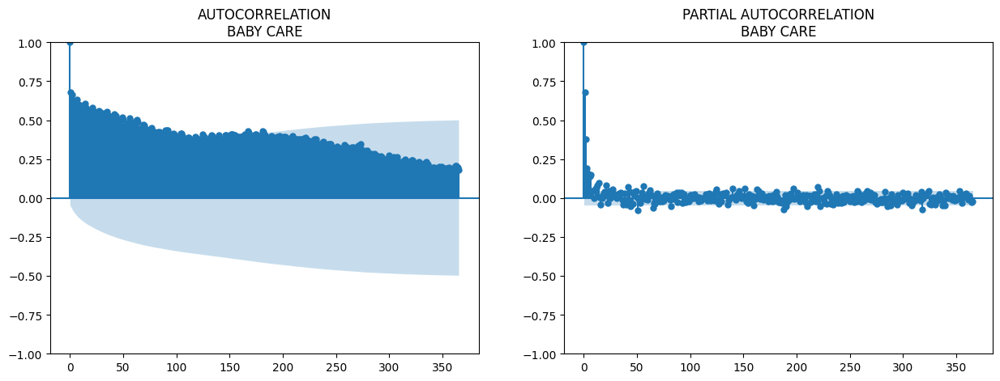

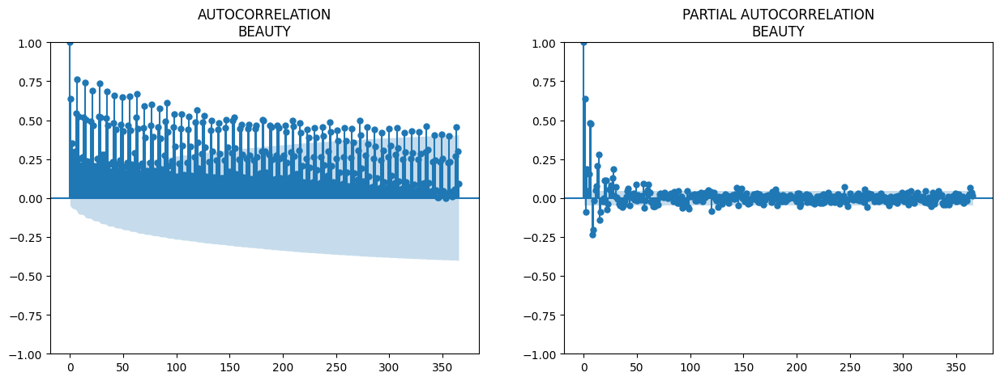

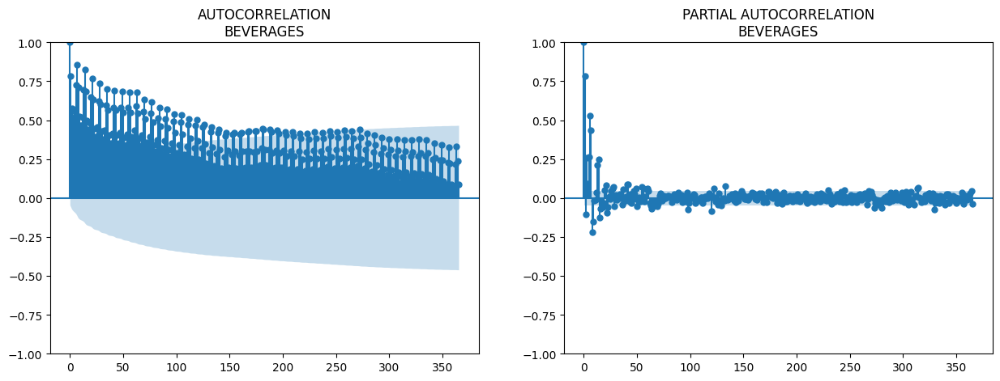

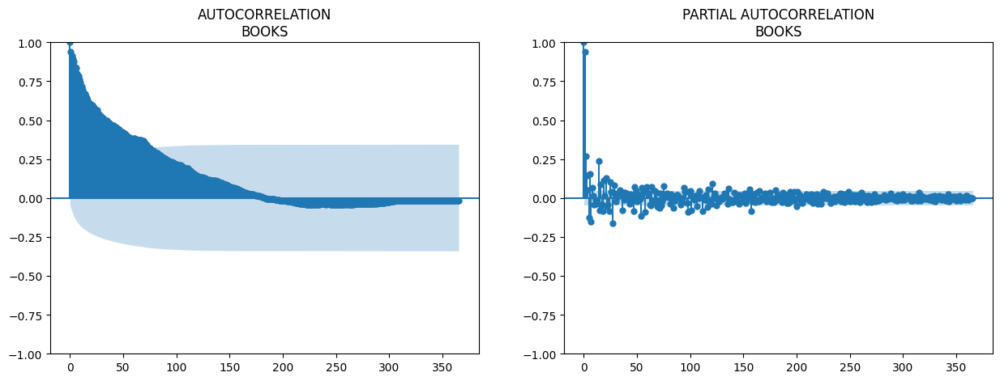

...

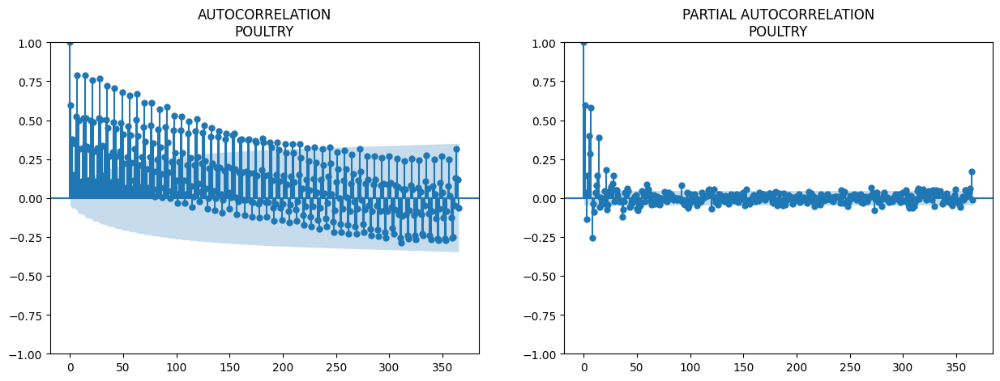

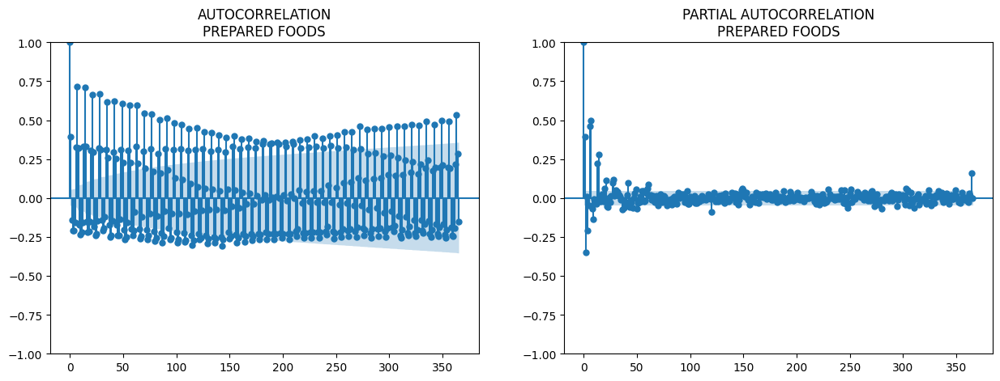

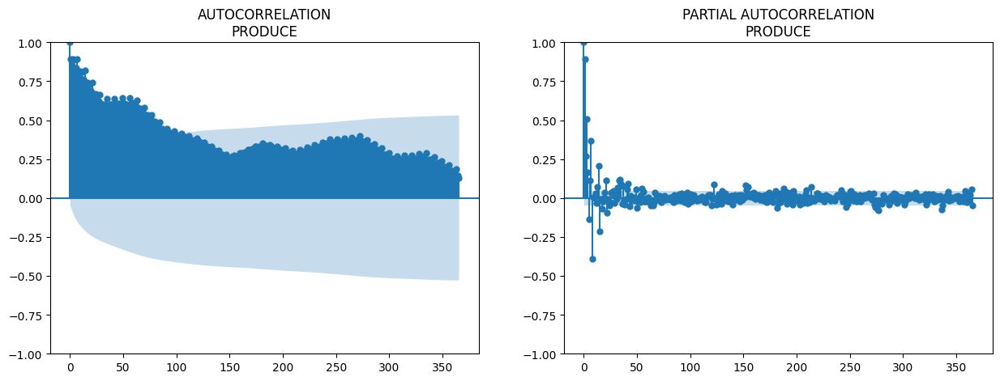

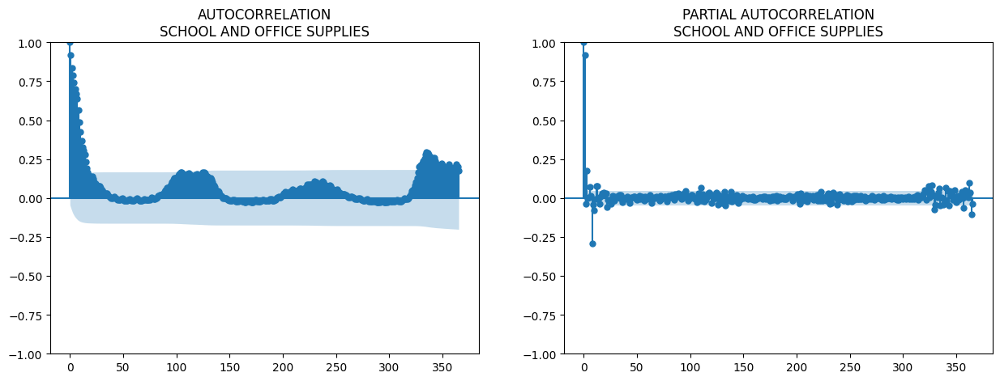

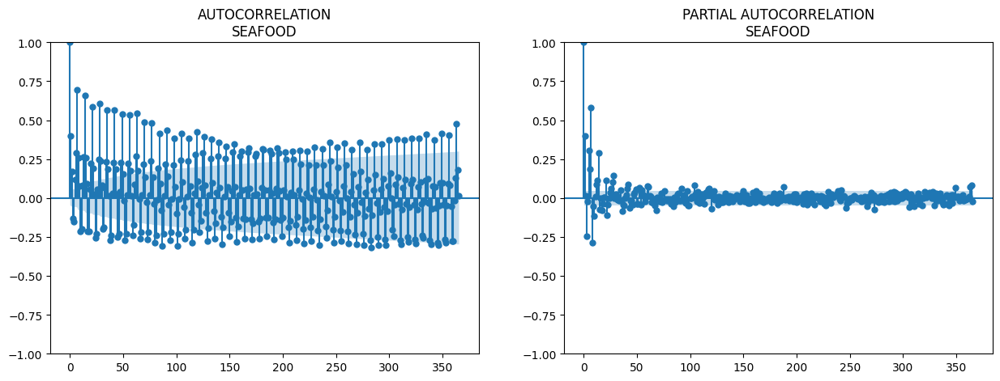

In [ ]:
a = d[(d.sales.notnull())].groupby(["date", "family"]).sales.mean().reset_index().set_index("date")
for num, i in enumerate(a.family.unique()):
    try:
        fig, ax = plt.subplots(1,2,figsize=(15,5))
        temp = a[(a.family == i)]#& (a.sales.notnull())
        sm.graphics.tsa.plot_acf(temp.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION\n" + i)
        sm.graphics.tsa.plot_pacf(temp.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION\n" + i)
    except:
        pass

df_copy = df_reducedd.copy()

In [ ]:
category_mapping = {
    "POULTRY": 1,
    "PREPARED FOODS": 1,
    "SEAFOOD": 1,
    "LAWN AND GARDEN": 1,
    "HOME CARE": 1,
    "EGGS": 1,
    "HARDWARE": 1,
    "GROCERY I": 1,
    "DAIRY": 1,
    "DELI": 1,
    "BREAD/BAKERY": 1,

    "AUTOMOTIVE": 2,
    "PET SUPPLIES": 2,
    "PLAYERS AND ELECTRONICS": 2,
    "LINGERIE": 2,
    "LADIESWEAR": 2,
    "FROZEN FOODS": 2,
    "GROCERY II": 2,
    "CELEBRATION": 2,
    "CLEANING": 2,
    "BEAUTY": 2,
    "BEVERAGES": 2,

    "PRODUCE": 3,
    "MEATS": 3,
    "PERSONAL CARE": 3,
    "HOME AND KITCHEN I": 3,
    "HOME AND KITCHEN II": 3,
    "HOME APPLIANCES": 3,

    "SCHOOL AND OFFICE SUPPLIES": 4,
    "LIQUOR, WINE, BEER": 4,

    "MAGAZINES": 5,
    "BOOKS": 5,
    "BABY CARE": 5
}

df_copy['encoded_family'] = df_copy['family'].map(category_mapping)

train = df_copy[df_copy['date'] < '2017-08-15']
test = df_copy[df_copy['date'] > '2017-08-15']


agg_dict = {
    'sales': 'mean',
    'season': 'first',
    'workday': 'max',
    'wageday': 'max',
    'dcoilwtico_interpolated': 'first',
    'onpromotion':'mean'
}


grouped_train = train.groupby(['date', 'cluster', 'encoded_family']).agg(agg_dict).reset_index()
grouped_train.head()


family_orders = {
    0: (2,1,1),  # seasonal
    1: (1,1,1),  # mildly seasonal
    2: (2,1,2),  # trend
    3: (1,1,0),  # erratic
    4: (2,1,0),  # high variability
}

seasonal_orders = {
    0: (1, 1, 0, 12),
    1: (1, 1, 1, 7),
    2: (0, 1, 1, 12),
    3: (0, 1, 0, 12),
    4: (1, 1, 0, 7),
}

In [ ]:
grouped_train.head()

,date,cluster,encoded_family,sales,season,workday,wageday,dcoilwtico_interpolated,onpromotion
0,2013-01-01,1,1.00,37.07,0,0,0,NaN,0.00
1,2013-01-01,1,2.00,32.74,0,0,0,NaN,0.00
2,2013-01-01,1,3.00,7.54,0,0,0,NaN,0.00
3,2013-01-01,1,4.00,0.00,0,0,0,NaN,0.00
4,2013-01-01,1,5.00,0.00,0,0,0,NaN,0.00


### ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

models = {}
predictions = []

# col to store predictions
test['sales_pred'] = np.nan

# Looping through clusters and families
for cluster, family in grouped_train.groupby(['cluster', 'encoded_family']).groups.keys():
    train_subset = grouped_train[(grouped_train['cluster'] == cluster) &
                                 (grouped_train['encoded_family'] == family)]

    if len(train_subset) < 15:
        continue

    # log1p transformation
    sales_log = np.log1p(train_subset['sales'])

    order = family_orders.get(family, (2, 1, 1))
    model = ARIMA(sales_log, order=order)
    fit = model.fit()
    models[(cluster, family)] = fit

    test_subset = test[(test['cluster'] == cluster) &
                       (test['encoded_family'] == family)]

    if not test_subset.empty:
        f_log = fit.predict(start=len(train_subset),
                            end=len(train_subset) + len(test_subset) - 1,
                            typ='levels')
        f = np.expm1(f_log)  # Reverse log1p
        test.loc[test_subset.index, 'sales_pred'] = f.values

test['sales_pred'] = test['sales_pred'].fillna(0)


In [ ]:
test['sales_pred'].isnull().sum()

0

### SARIMA

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima_models = {}
test['sales_pred_sarima'] = np.nan
for cluster, family in grouped_train.groupby(['cluster', 'encoded_family']).groups.keys():
    train_subset = grouped_train[(grouped_train['cluster'] == cluster) &
                                 (grouped_train['encoded_family'] == family)]

    if len(train_subset) < 15:
        continue

    order = family_orders.get(family, (2,1,1))
    seasonal_order = seasonal_orders.get(family, (0,0,0,12))

    model = SARIMAX(train_subset['sales'], order=order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False)

    fit = model.fit(disp=False)

    # Store
    sarima_models[(cluster, family)] = fit

    test_subset = test[(test['cluster'] == cluster) &
                       (test['encoded_family'] == family)]

    if not test_subset.empty:
        f = fit.predict(start=len(train_subset),
                        end=len(train_subset) + len(test_subset) - 1,
                        typ='levels')
        test.loc[test_subset.index, 'sales_pred_sarima'] = f.values

# Filling missing predictions with 0
test['sales_pred_sarima'] = test['sales_pred_sarima'].fillna(0)

In [ ]:
test['sales_pred_sarima'].isnull().sum()

0

In [ ]:
# Select only ID and predicted sales columns for output CSVs
output_df_arima = test[['id', 'sales_pred']]
output_df_sarima = test[['id', 'sales_pred_sarima']]

# Save to CSV files for each model type
output_df_arima.to_csv('arima_predictions.csv', index=False)
output_df_sarima.to_csv('sarima_predictions.csv', index=False)

### Private Score: 1249826.24386
### Public Score: 1272610.31016



